# Sweden CBA / PBA hotspot analysis — notebook 2 of 3: visualisations — conventional analysis

This notebook produces visualisations for the conventional national hotspot analysis built in `01_build_dataframes.ipynb` — run that notebook first to generate `./outputs/analysis_objects.pkl`.

For **GHG and material**, it visualises direct production-side flows and Leontief-traced consumption-side, source, and destination attribution. For the **economic dimension**, it visualises complementary monetary scale indicators: Swedish gross output on the production side and direct final-demand expenditure on the consumption side.

**Chart types:** horizontal bar charts (matplotlib), material composition stacks (matplotlib), country × sector heatmaps (matplotlib/seaborn), Sankey diagrams (Plotly), and sunburst charts (Plotly).

**Chart rule:** one dimension per chart. Most charts show one perspective at a time. Section 10 intentionally shows CBA source location and production-side final-demand destination side by side for the same dimension, because those two shares are most meaningful when read together.

**Sections:**
- **6** Production-side hotspots (bar charts and material stacks)
- **7** Consumption-side hotspots (bar charts and material stacks)
- **8** Source attribution (bar charts, heatmaps, Sankeys, sunbursts — GHG and material; bar charts and heatmaps — economic)
- **9** Production-side destination attribution (bar charts and Sankeys)
- **10** Source location vs final-demand destination share (GHG and material only)

**Plotly PNG export** requires the `kaleido` package. Install once with `pip install kaleido`.


In [1]:
import pickle
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

from IPython.display import Image, display

# ── Constants — must match 01_build_dataframes.ipynb ─────────────────────────
REGION     = "SE"
OUTPUT_DIR = Path("./outputs")

sns.set_style("whitegrid")
plt.rcParams.update({"figure.dpi": 110, "savefig.dpi": 200,
                     "axes.titlesize": 11, "axes.labelsize": 9,
                     "xtick.labelsize": 8, "ytick.labelsize": 8})

# ── Load pre-computed analysis objects ────────────────────────────────────────
_pkl_path = OUTPUT_DIR / "analysis_objects.pkl"
with open(_pkl_path, "rb") as _f:
    _data = pickle.load(_f)

TOP_N = _data["TOP_N"]
TOP_C = _data["TOP_C"]

pba_SE             = _data["pba_SE"]
cba_SE             = _data["cba_SE"]
F_mat_SE           = _data["F_mat_SE"]
cba_mat_by_sec     = _data["cba_mat_by_sec"]
x_SE               = _data["x_SE"]
# ── Consumption-side source attribution ────────────────────────────────────────────────────────────────
src_econ_country   = _data["src_econ_country"]
src_ghg_country    = _data["src_ghg_country"]
src_mat_country    = _data["src_mat_country"]
src_econ           = _data["src_econ"]
src_ghg            = _data["src_ghg"]
src_mat_total      = _data["src_mat_total"]
attrib_econ        = _data["attrib_econ"]
attrib_ghg         = _data["attrib_ghg"]
attrib_mat_total   = _data["attrib_mat_total"]
# ── Production-side destination attribution ───────────────────────────────────────────────────────────
econ_dest_country  = _data["econ_dest_country"]
ghg_dest_country   = _data["ghg_dest_country"]
mat_dest_country   = _data["mat_dest_country"]
F_econ_dest        = _data["F_econ_dest"]
F_ghg_dest         = _data["F_ghg_dest"]
F_mat_dest_total   = _data["F_mat_dest_total"]
# ── Direct impact vectors ─────────────────────────────────────────────────────
F_ghg_SE           = _data["F_ghg_SE"]
F_mat_total_SE     = _data["F_mat_total_SE"]

print("Analysis objects loaded.")
print(f"  TOP_N={TOP_N}, TOP_C={TOP_C}")
print(f"  pba_SE shape : {pba_SE.shape}")
print(f"  cba_SE shape : {cba_SE.shape}")


Analysis objects loaded.
  TOP_N=15, TOP_C=5
  pba_SE shape : (200, 7)
  cba_SE shape : (200, 7)


In [2]:
# ── Shared helpers ────────────────────────────────────────────────────────────

def trim(label, n=45):
    return label if len(label) <= n else label[:n-1] + "\u2026"

def plot_top_horiz(df, col, title, xlabel, color, filename, n=None):
    """Single horizontal bar chart — top N sectors by one column."""
    n = n or TOP_N
    top = df.nlargest(n, col).iloc[::-1]
    labels = [trim(s) for s in top.index]
    fig, ax = plt.subplots(figsize=(11, max(5, n * 0.42)))
    ax.barh(labels, top[col], color=color, edgecolor="white")
    ax.set_title(title, fontsize=11, weight="bold")
    ax.set_xlabel(xlabel, fontsize=9)
    ax.grid(axis="x", alpha=0.3)
    ax.tick_params(labelsize=8)
    fig.tight_layout()
    plt.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()

def plot_material_stack(top_sectors, mat_df, title, filename):
    """Stacked horizontal bar chart of material categories."""
    df = mat_df.T.loc[top_sectors].iloc[::-1]
    fig, ax = plt.subplots(figsize=(11, 6))
    colors = {"biomass": "#6b9b37", "fossil": "#c66d3c",
              "metals": "#7a6f91", "minerals": "#c8a850"}
    left = np.zeros(len(df))
    labels = [trim(s) for s in df.index]
    for cat in ["biomass", "fossil", "metals", "minerals"]:
        ax.barh(labels, df[cat], left=left, color=colors[cat],
                label=cat.capitalize(), edgecolor="white", linewidth=0.5)
        left += df[cat].values
    ax.set_xlabel("kt")
    ax.set_title(title, weight="bold")
    ax.legend(loc="lower right")
    ax.grid(axis="x", alpha=0.3)
    fig.tight_layout()
    plt.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()

def heatmap_source(src_series, title, filename,
                   n_countries=12, n_sectors=15, unit="",
                   xlabel="Source sector", ylabel="Source country"):
    """Country x sector heatmap for source or destination attribution."""
    src_series = src_series.fillna(0.0)
    m = src_series.unstack(level="sector").fillna(0.0)
    m = m.loc[m.sum(axis=1) > 0, m.sum(axis=0) > 0]
    if m.empty:
        raise ValueError(f"No positive values for: {title}")
    top_c = m.sum(axis=1).nlargest(n_countries).index
    top_s = m.sum(axis=0).nlargest(n_sectors).index
    sub   = m.loc[top_c, top_s]
    fig, ax = plt.subplots(figsize=(13, 6))
    sns.heatmap(sub, cmap="YlOrRd", annot=True, fmt=".0f", linewidths=0.3,
                cbar_kws={"label": unit}, ax=ax, annot_kws={"size": 7})
    ax.set_title(title, weight="bold")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticklabels([trim(t.get_text(), 30) for t in ax.get_xticklabels()],
                       rotation=35, ha="right")
    fig.tight_layout()
    plt.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()

def export_plotly(fig, png_name, width=1500, height=850, scale=2):
    """Save Plotly figure as static PNG (GitHub-visible). Requires kaleido."""
    png_path = OUTPUT_DIR / png_name
    try:
        fig.write_image(str(png_path), format="png", width=width, height=height, scale=scale)
        display(Image(filename=str(png_path)))
    except Exception as e:
        print(f"PNG export skipped ({type(e).__name__}). Install kaleido to enable.")
        fig.show()

def sankey_source_to_consumption(attrib, title, png_filename,
                                 n_src=15, n_cons=10, unit_label="",
                                 color_left="#3a6c8c", color_right="#c66d3c"):
    """Sankey: (origin country, origin sector) → Swedish consumed product."""
    attrib = attrib.fillna(0.0)
    row_tot = attrib.sum(axis=1)
    col_tot = attrib.sum(axis=0)
    top_src  = row_tot[row_tot > 0].nlargest(n_src).index
    top_cons = col_tot[col_tot > 0].nlargest(n_cons).index
    if len(top_src) == 0 or len(top_cons) == 0:
        raise ValueError(f"No positive flows for: {title}")
    sub = attrib.loc[top_src, top_cons]
    left_labels  = [f"{c} — {trim(s, 30)}" for (c, s) in top_src]
    right_labels = [trim(s, 40) for s in top_cons]
    nodes = left_labels + right_labels
    colors = [color_left] * len(left_labels) + [color_right] * len(right_labels)
    sources, targets, values = [], [], []
    for i, src_idx in enumerate(top_src):
        for j, cons in enumerate(top_cons):
            v = float(sub.loc[src_idx, cons])
            if v > 0:
                sources.append(i); targets.append(len(left_labels) + j); values.append(v)
    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(label=nodes, pad=14, thickness=16, color=colors,
                  line=dict(color="white", width=0.5)),
        link=dict(source=sources, target=targets, value=values,
                  color="rgba(120,120,120,0.25)")
    )])
    fig.update_layout(
        title=dict(text=f"{title}  ({unit_label})", font=dict(size=14)),
        font=dict(size=10), height=650, margin=dict(l=10, r=10, t=55, b=10))
    export_plotly(fig, png_filename)
    return fig

def sankey_sector_to_destination(F_dest_country, pba_series, title, png_filename,
                                  n_sec=12, n_dest=10, unit_label="",
                                  color_left="#6b9b37", color_right="#3a6c8c"):
    """Sankey: Swedish producing sector → destination country.
    F_dest_country: (SE_sectors, countries) DataFrame already aggregated by region.
    """
    F_dest_country = F_dest_country.fillna(0.0)
    top_secs  = pba_series[pba_series > 0].nlargest(n_sec).index
    col_sums  = F_dest_country.sum(axis=0)
    top_dests = col_sums[col_sums > 0].nlargest(n_dest).index.tolist()
    if REGION not in top_dests and REGION in F_dest_country.columns:
        top_dests.append(REGION)
    if len(top_secs) == 0 or len(top_dests) == 0:
        raise ValueError(f"No positive flows for: {title}")
    sub = F_dest_country.loc[top_secs, top_dests]
    left_labels  = [trim(s, 40) for s in top_secs]
    right_labels = list(top_dests)
    nodes  = left_labels + right_labels
    right_colors = ["#a84020" if c == REGION else color_right for c in right_labels]
    colors = [color_left] * len(left_labels) + right_colors
    sources, targets, values = [], [], []
    for i, s in enumerate(top_secs):
        for j, c in enumerate(top_dests):
            v = float(sub.loc[s, c])
            if v > 0:
                sources.append(i); targets.append(len(left_labels) + j); values.append(v)
    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(label=nodes, pad=14, thickness=16, color=colors,
                  line=dict(color="white", width=0.5)),
        link=dict(source=sources, target=targets, value=values,
                  color="rgba(120,120,120,0.25)")
    )])
    fig.update_layout(
        title=dict(text=f"{title}  ({unit_label})", font=dict(size=14)),
        font=dict(size=10), height=650, margin=dict(l=10, r=10, t=55, b=10))
    export_plotly(fig, png_filename)
    return fig

def sunburst_cba(src_series, title, png_filename, n_country=10, n_sector=6, unit=""):
    """Sunburst: country (inner ring) → top source sectors per country (outer ring)."""
    df = src_series.rename("value").reset_index()
    df = df[df["value"] > 0].copy()
    if df.empty:
        raise ValueError(f"No positive values for: {title}")
    top_c = set(df.groupby("region")["value"].sum().nlargest(n_country).index)
    df["country_label"] = df["region"].where(df["region"].isin(top_c), "Other countries")
    sector_rank = (
        df.groupby(["country_label", "sector"], as_index=False)["value"].sum()
          .sort_values(["country_label", "value"], ascending=[True, False])
    )
    sector_rank["rank"] = sector_rank.groupby("country_label")["value"].rank(
        method="first", ascending=False)
    top_pairs = sector_rank.loc[sector_rank["rank"] <= n_sector,
                                ["country_label", "sector"]].copy()
    top_pairs["is_top_sector"] = True
    df = df.merge(top_pairs, on=["country_label", "sector"], how="left")
    is_top = df["is_top_sector"].fillna(False).astype(bool)
    df["sector_label"] = np.where(is_top, df["sector"], "Other sectors")
    df_sun = (df.groupby(["country_label", "sector_label"], as_index=False)["value"]
                .sum().sort_values("value", ascending=False))
    df_sun["sector_label"] = df_sun["sector_label"].apply(lambda s: trim(s, 35))
    fig = px.sunburst(df_sun, path=["country_label", "sector_label"], values="value",
                      color="value", color_continuous_scale="Viridis",
                      title=f"{title}  ({unit})")
    fig.update_layout(height=650, margin=dict(l=10, r=10, t=55, b=10))
    export_plotly(fig, png_filename)
    return fig

def plot_top_pairs(series, value_col, title, xlabel, color, filename, n=None):
    """Horizontal bar chart for a Series with (region, sector) MultiIndex.

    Flattens the MultiIndex into 'country — sector' string labels before
    plotting, which avoids the unhashable-tuple error in matplotlib.
    """
    n = n or TOP_N
    top = series.dropna().nlargest(n).iloc[::-1]
    labels = [f"{c} — {trim(s, 35)}" for c, s in top.index]
    fig, ax = plt.subplots(figsize=(11, max(5, n * 0.42)))
    ax.barh(labels, top.values, color=color, edgecolor="white")
    ax.set_title(title, fontsize=11, weight="bold")
    ax.set_xlabel(xlabel, fontsize=9)
    ax.grid(axis="x", alpha=0.3)
    ax.tick_params(labelsize=8)
    fig.tight_layout()
    plt.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()

print("Helpers defined.")


Helpers defined.


## 6. Production-side hotspots — Sweden

Top Swedish sectors by gross output, GHG emissions, and material extraction. Each chart covers one dimension independently.

### 6.1 Gross output — top sectors

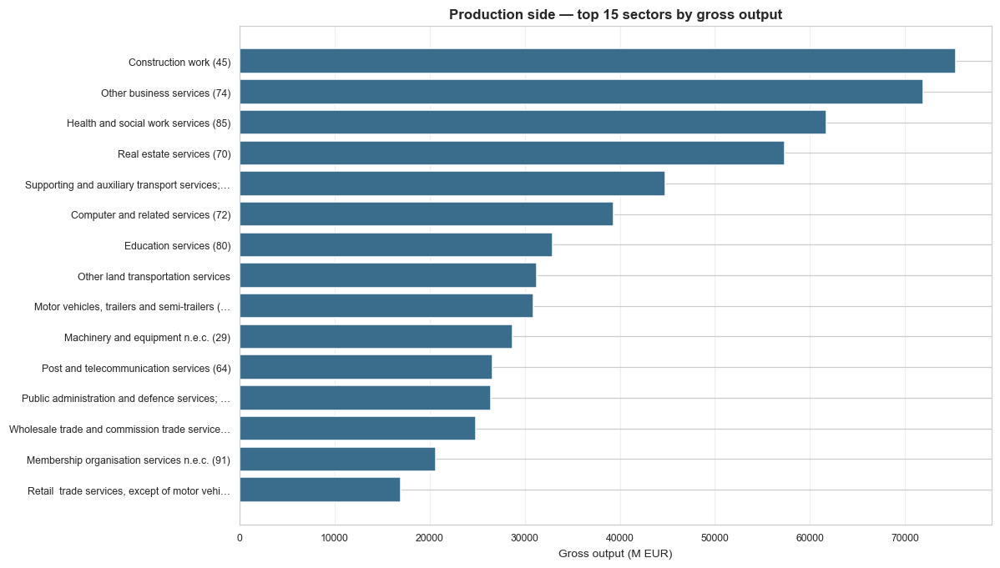

In [3]:
plot_top_horiz(pba_SE, "Gross output (M EUR)",
    f"Production side — top {TOP_N} sectors by gross output",
    "Gross output (M EUR)", "#3a6c8c",
    "fig_pba_gross_output.png")


### 6.2 GHG emissions — top sectors

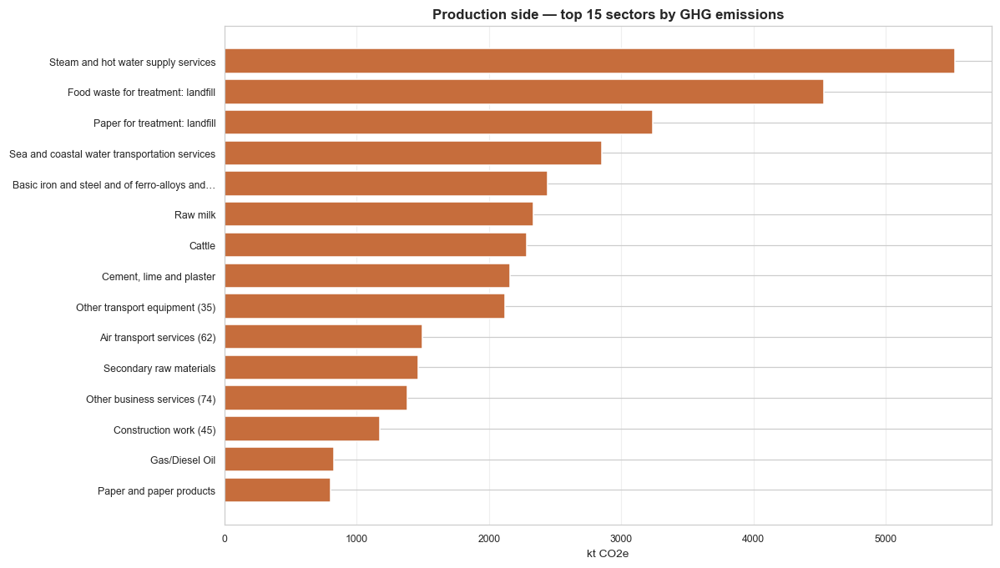

In [4]:
plot_top_horiz(pba_SE, "GHG total (kt CO2e)",
    f"Production side — top {TOP_N} sectors by GHG emissions",
    "kt CO2e", "#c66d3c",
    "fig_pba_ghg.png")


### 6.3 Material extraction — top sectors

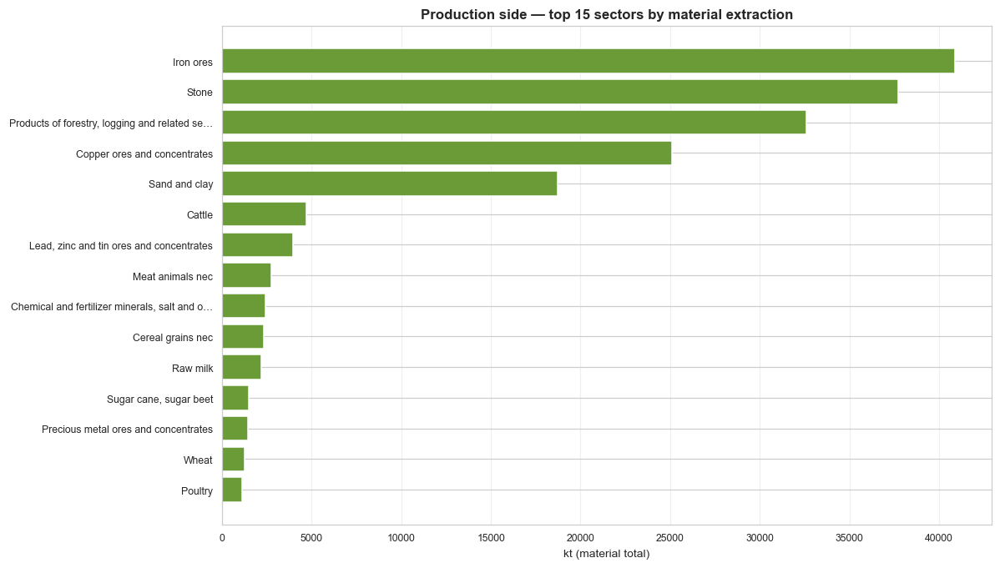

In [5]:
plot_top_horiz(pba_SE, "Material total (kt)",
    f"Production side — top {TOP_N} sectors by material extraction",
    "kt (material total)", "#6b9b37",
    "fig_pba_material.png")


### 6.4 Material composition — production side

Stacked breakdown of the top-12 material sectors into the four Anthesis primary categories.

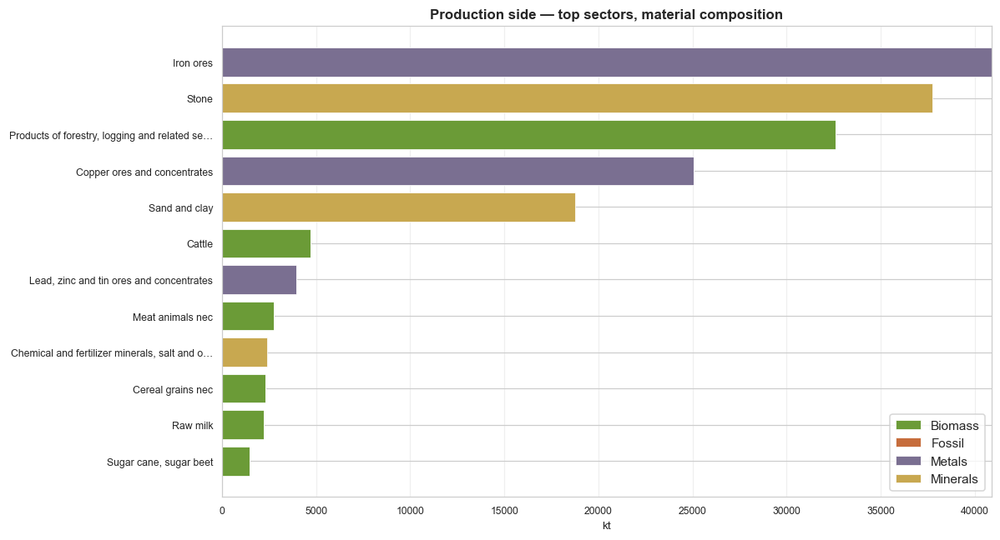

In [6]:
top_pba_mat = pba_SE.nlargest(12, "Material total (kt)").index.tolist()
plot_material_stack(top_pba_mat, F_mat_SE,
    "Production side — top sectors, material composition",
    "fig_pba_material_stack.png")


## 7. Consumption-side hotspots — Sweden

Top consumed product categories by direct expenditure, Leontief-traced GHG footprint, and Leontief-traced material footprint.

### 7.1 Direct expenditure — top consumed sectors

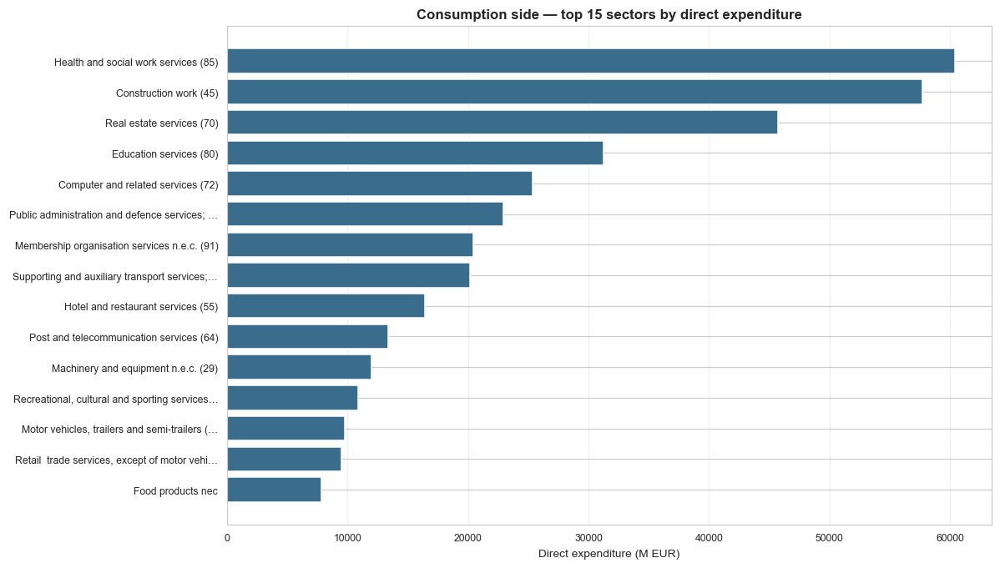

In [7]:
plot_top_horiz(cba_SE, "Direct expenditure (M EUR)",
    f"Consumption side — top {TOP_N} sectors by direct expenditure",
    "Direct expenditure (M EUR)", "#3a6c8c",
    "fig_cba_expenditure.png")


### 7.2 GHG footprint — top consumed sectors

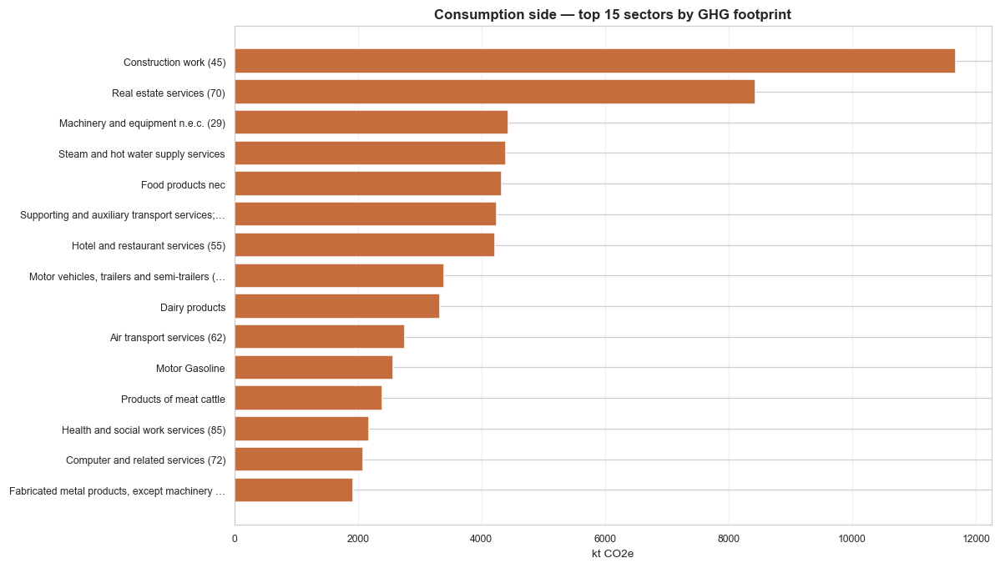

In [8]:
plot_top_horiz(cba_SE, "GHG total (kt CO2e)",
    f"Consumption side — top {TOP_N} sectors by GHG footprint",
    "kt CO2e", "#c66d3c",
    "fig_cba_ghg.png")


### 7.3 Material footprint — top consumed sectors

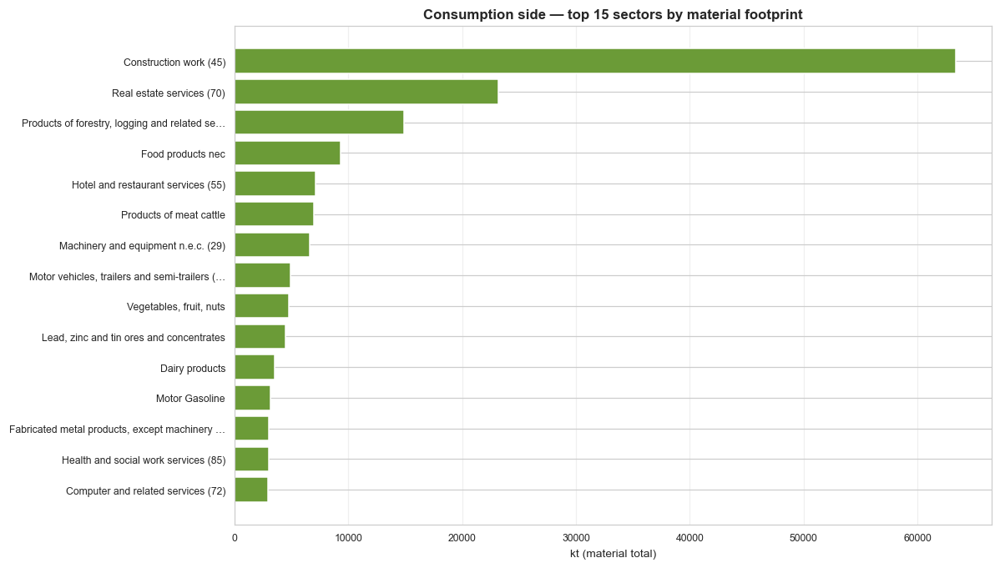

In [9]:
plot_top_horiz(cba_SE, "Material total (kt)",
    f"Consumption side — top {TOP_N} sectors by material footprint",
    "kt (material total)", "#6b9b37",
    "fig_cba_material.png")


### 7.4 Material composition — consumption side

Stacked breakdown of the top-12 material footprint sectors into the four Anthesis primary categories.

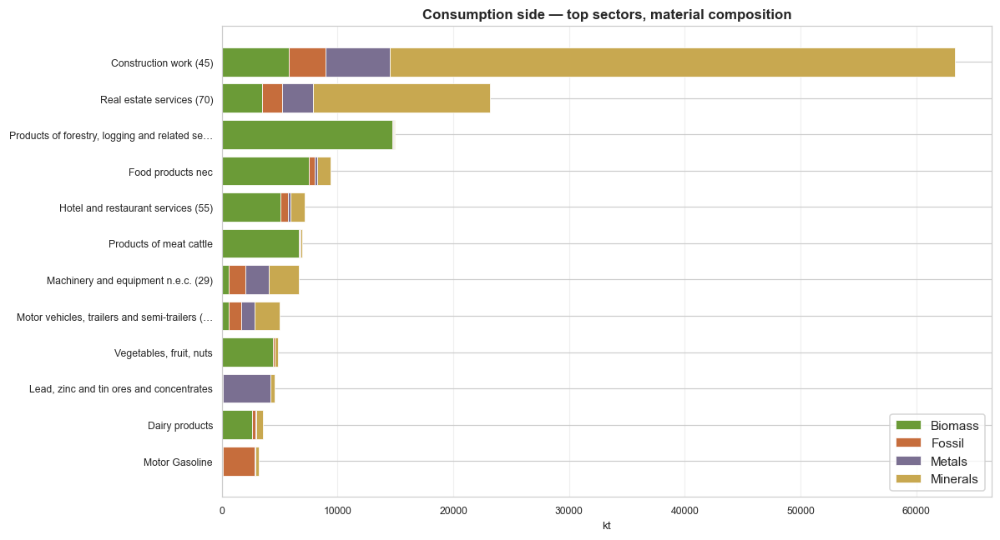

In [10]:
top_cba_mat = cba_SE.nlargest(12, "Material total (kt)").index.tolist()
plot_material_stack(top_cba_mat, cba_mat_by_sec,
    "Consumption side — top sectors, material composition",
    "fig_cba_material_stack.png")


## 8. Source attribution

For the **economic dimension**, this section shows Sweden's direct supplier country and sector, based on final-demand expenditure. The charts answer: who does Sweden pay directly? This is not the same as where the upstream economic activity embodied in those products occurred.

For **GHG and material**, this section shows where supply-chain impacts occur, using the Leontief-traced source attribution from notebook 1. The charts answer: which (country, sector) nodes globally generate the GHG emissions and material extraction that are embodied in Sweden's consumption? This traces through all upstream tiers.

Bar charts show the top (country, sector) pairs per dimension. Heatmaps show country × sector concentration. Sankeys and sunbursts are shown for GHG and material only, where Leontief tracing produces cross-sector flow information that the Sankey format makes interpretable. For the economic dimension, a Sankey would be trivially diagonal (Sweden pays motor vehicle exporters for motor vehicles) and adds nothing beyond the bar chart; it is therefore omitted.


### 8.1 Direct expenditure — top direct supplier (country, sector) pairs


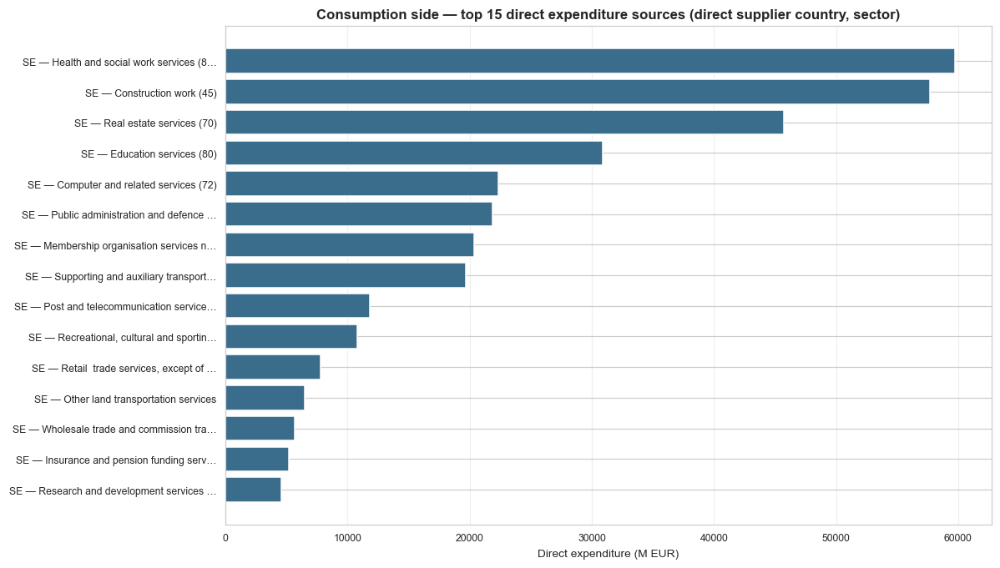

In [11]:
plot_top_pairs(src_econ,
    "Direct expenditure (M EUR)",
    f"Consumption side — top {TOP_N} direct expenditure sources (direct supplier country, sector)",
    "Direct expenditure (M EUR)", "#3a6c8c",
    "fig_cba_source_econ.png")


### 8.2 GHG footprint source — top (country, sector) pairs


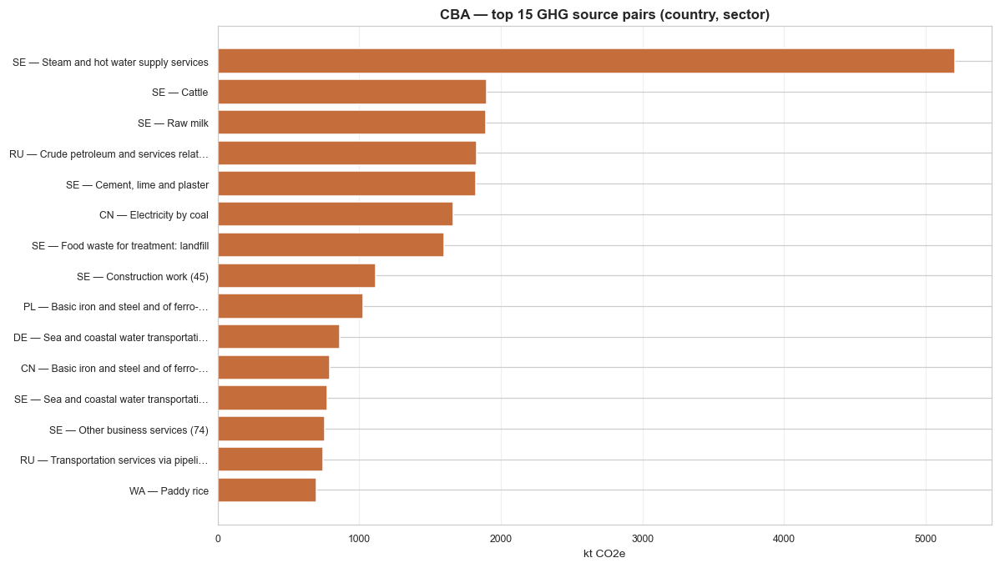

In [12]:
plot_top_pairs(src_ghg,
    "GHG total (kt CO2e)",
    f"CBA — top {TOP_N} GHG source pairs (country, sector)",
    "kt CO2e", "#c66d3c",
    "fig_cba_source_ghg.png")


### 8.3 Material footprint source — top (country, sector) pairs


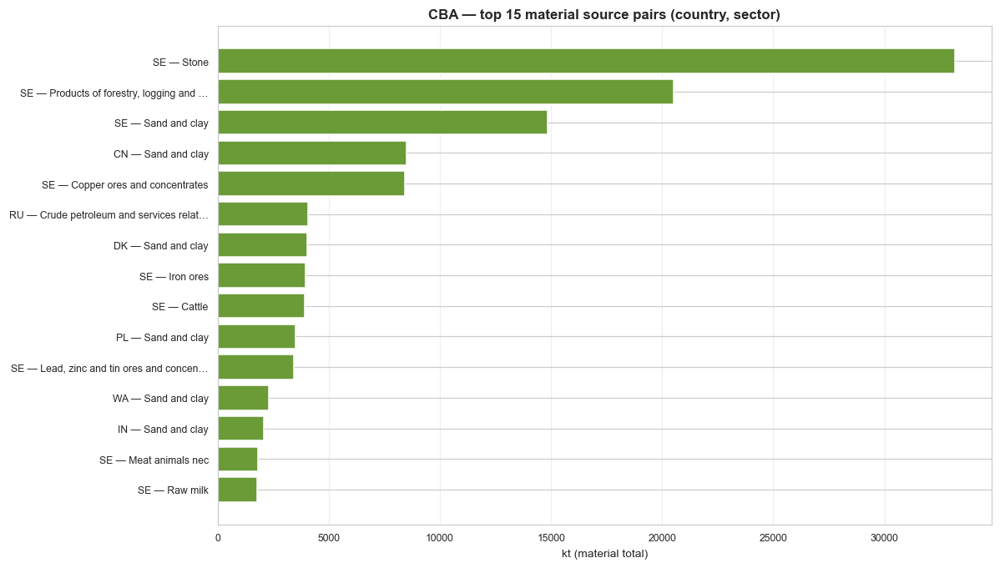

In [13]:
plot_top_pairs(src_mat_total,
    "Material total (kt)",
    f"CBA — top {TOP_N} material source pairs (country, sector)",
    "kt (material total)", "#6b9b37",
    "fig_cba_source_mat.png")


### 8.4–8.5 Heatmaps — country × sector source attribution

For the economic dimension, the heatmap shows Sweden's direct expenditure by supplier country and sector. For GHG and material, it shows Leontief-traced footprint source attribution.


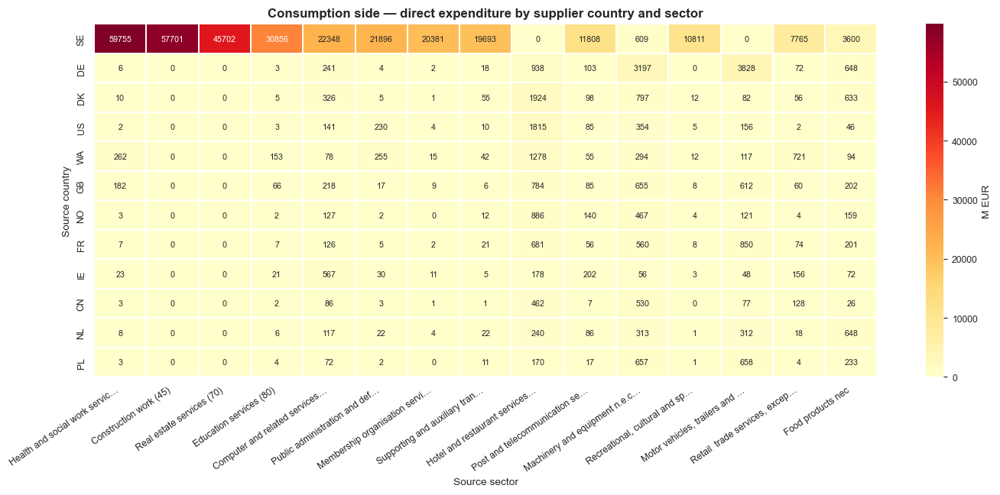

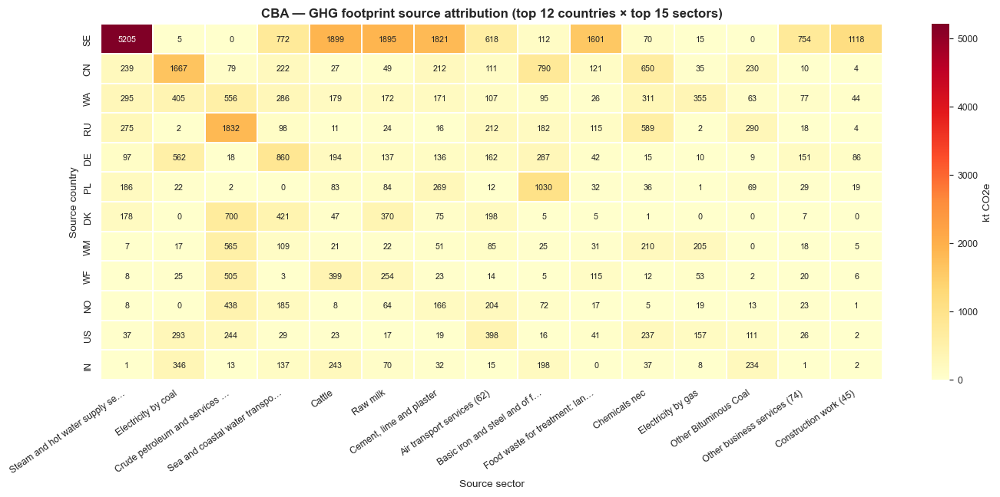

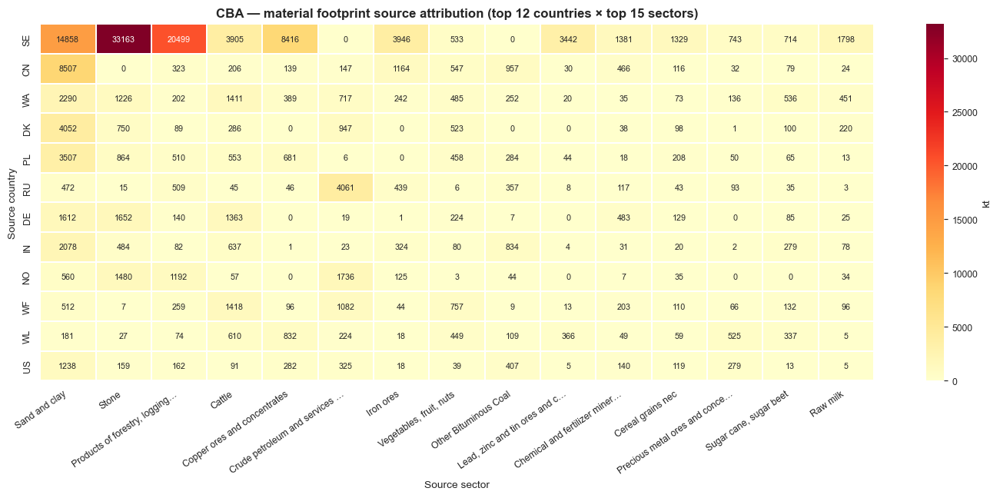

In [14]:
heatmap_source(src_econ,
    "Consumption side — direct expenditure by supplier country and sector",
    "fig_heatmap_econ.png", unit="M EUR")

heatmap_source(src_ghg,
    "CBA — GHG footprint source attribution (top 12 countries × top 15 sectors)",
    "fig_heatmap_ghg.png", unit="kt CO2e")

heatmap_source(src_mat_total,
    "CBA — material footprint source attribution (top 12 countries × top 15 sectors)",
    "fig_heatmap_material.png", unit="kt")


### 8.6–8.7 Sankeys — GHG and material source flows

Left column: top (origin country, origin sector) pairs in the global supply chain. Right column: top Swedish consumed products. Ribbon thickness = attributed flow magnitude. Economic dimension omitted — see section 8 header for rationale.


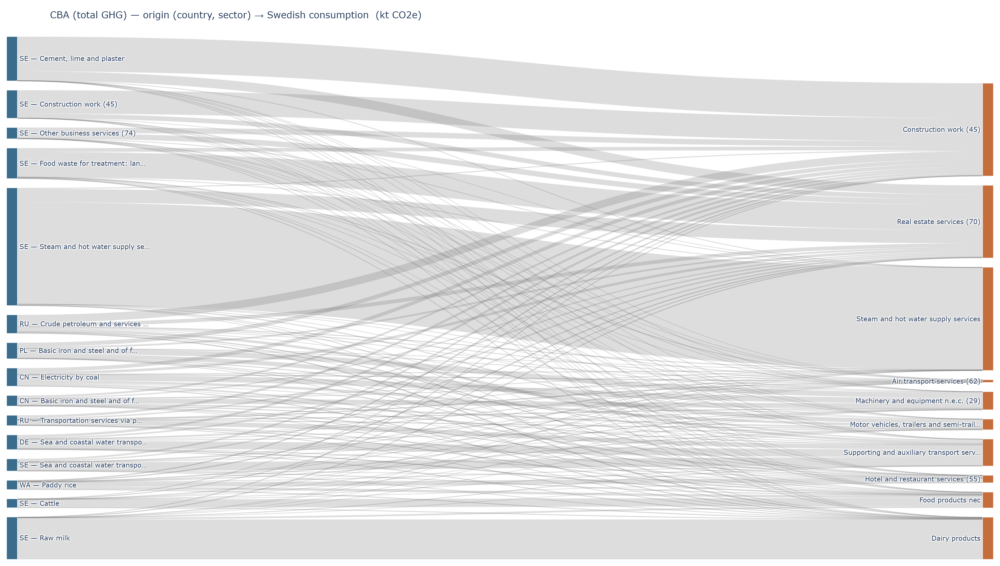

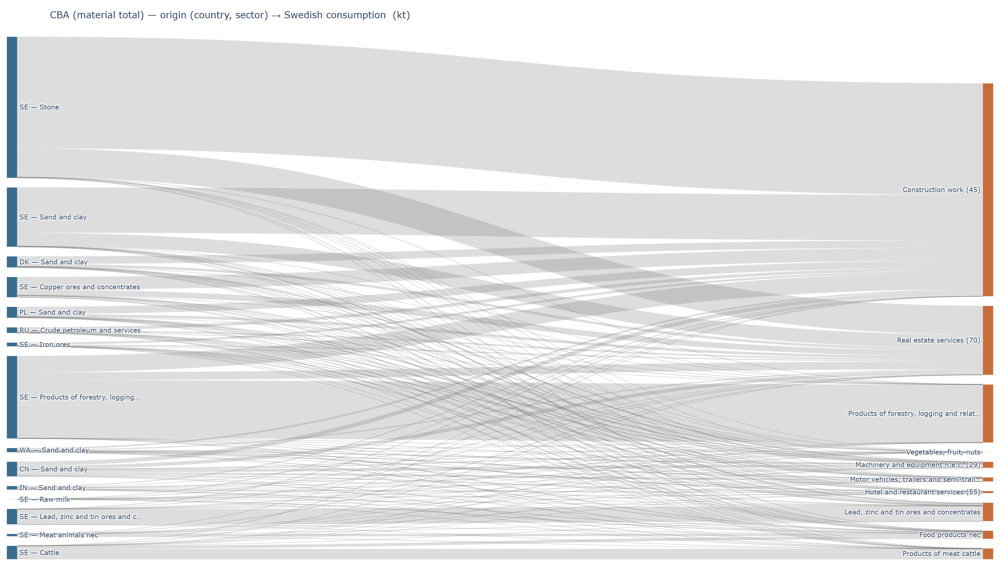

In [15]:
_ = sankey_source_to_consumption(attrib_ghg,
    "CBA (total GHG) — origin (country, sector) → Swedish consumption",
    "sankey_ghg_source.png", unit_label="kt CO2e")

_ = sankey_source_to_consumption(attrib_mat_total,
    "CBA (material total) — origin (country, sector) → Swedish consumption",
    "sankey_material_source.png", unit_label="kt")


### 8.8–8.9 Sunbursts — GHG and material source composition

Hierarchical view: country (inner ring) → top source sectors per country (outer ring). Economic dimension omitted — see section 8 header for rationale.


C:\Users\rafaella\AppData\Local\Temp\ipykernel_35872\3996080303.py:167: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  is_top = df["is_top_sector"].fillna(False).astype(bool)


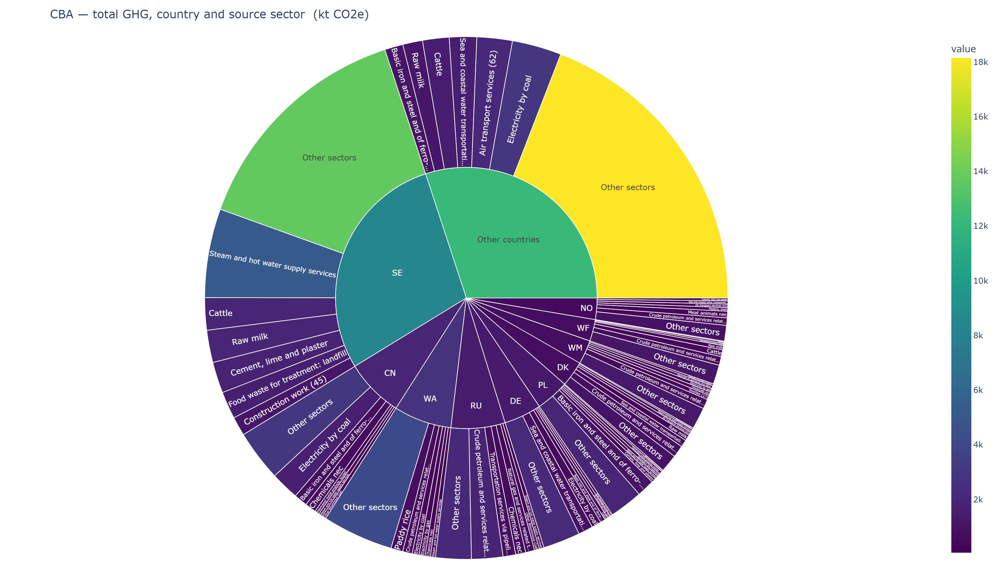

C:\Users\rafaella\AppData\Local\Temp\ipykernel_35872\3996080303.py:167: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  is_top = df["is_top_sector"].fillna(False).astype(bool)


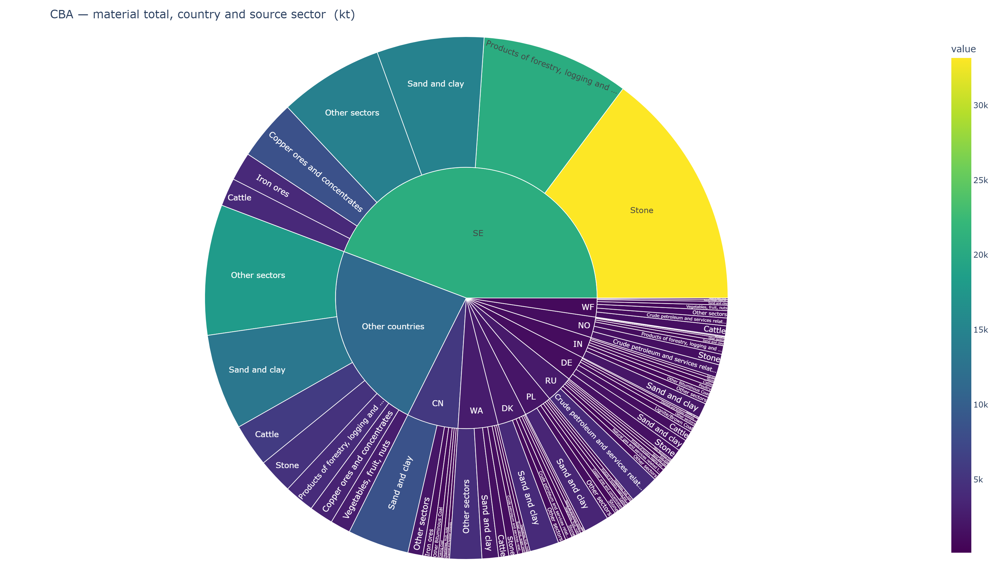

In [16]:
_ = sunburst_cba(src_ghg,
    "CBA — total GHG, country and source sector",
    "sunburst_ghg_source.png", unit="kt CO2e")

_ = sunburst_cba(src_mat_total,
    "CBA — material total, country and source sector",
    "sunburst_material_source.png", unit="kt")


## 9. Production-side destination attribution

For **GHG and material**, this section shows which final-demand countries are served by Sweden's territorial production impacts, using Leontief-traced destination attribution from notebook 1.

For the **economic dimension**, it shows direct market destinations: the immediate buyer country of Swedish gross output, based on direct sales in `Z` and `Y`. These two destination concepts are not equivalent — Leontief destination tracing attributes impacts to ultimate final consumers, while the economic destination shows immediate buyers who may further process Sweden's output before it reaches final demand.

Bar charts show top destination countries. Sankeys trace flows from Swedish producing sectors to destination countries. Dark red nodes = Sweden (retained domestic share).


### 9.1 Gross output destination — top countries

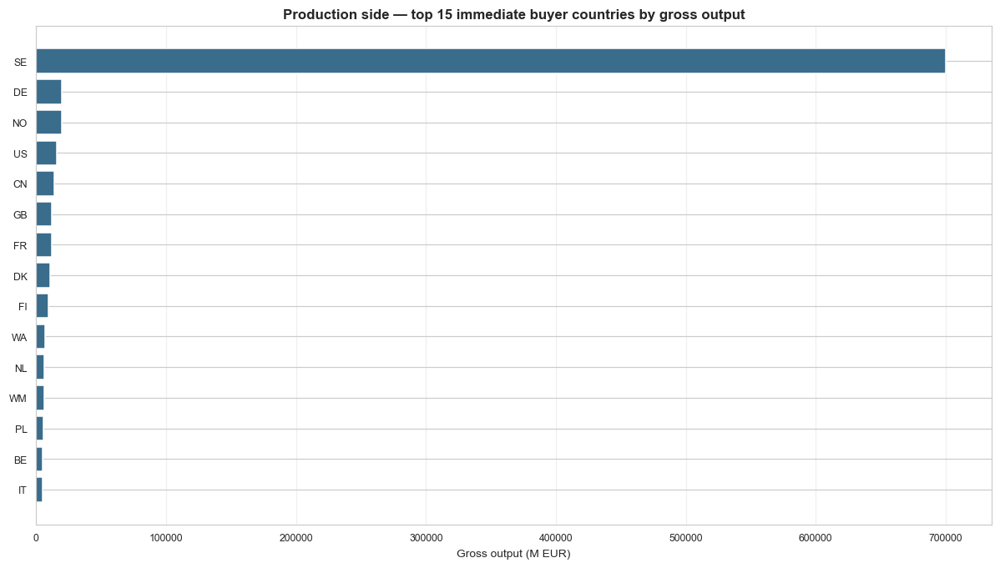

In [17]:
plot_top_horiz(econ_dest_country.rename("Gross output (M EUR)").to_frame(),
    "Gross output (M EUR)",
    f"Production side — top {TOP_N} immediate buyer countries by gross output",
    "Gross output (M EUR)", "#3a6c8c",
    "fig_pba_dest_econ.png")


### 9.2 GHG destination — top countries

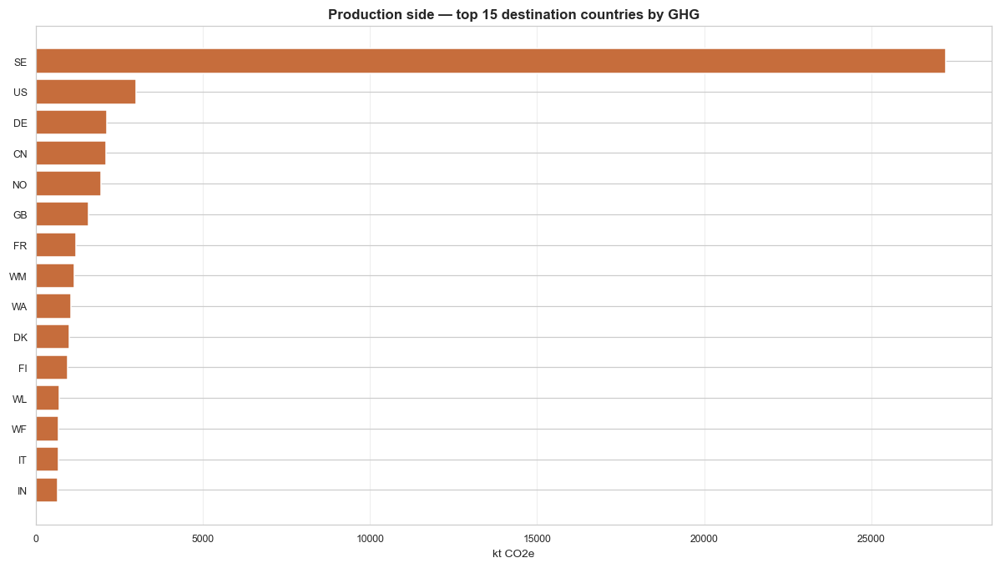

In [18]:
plot_top_horiz(ghg_dest_country.rename("GHG total (kt CO2e)").to_frame(),
    "GHG total (kt CO2e)",
    f"Production side — top {TOP_N} destination countries by GHG",
    "kt CO2e", "#c66d3c",
    "fig_pba_dest_ghg.png")


### 9.3 Material destination — top countries

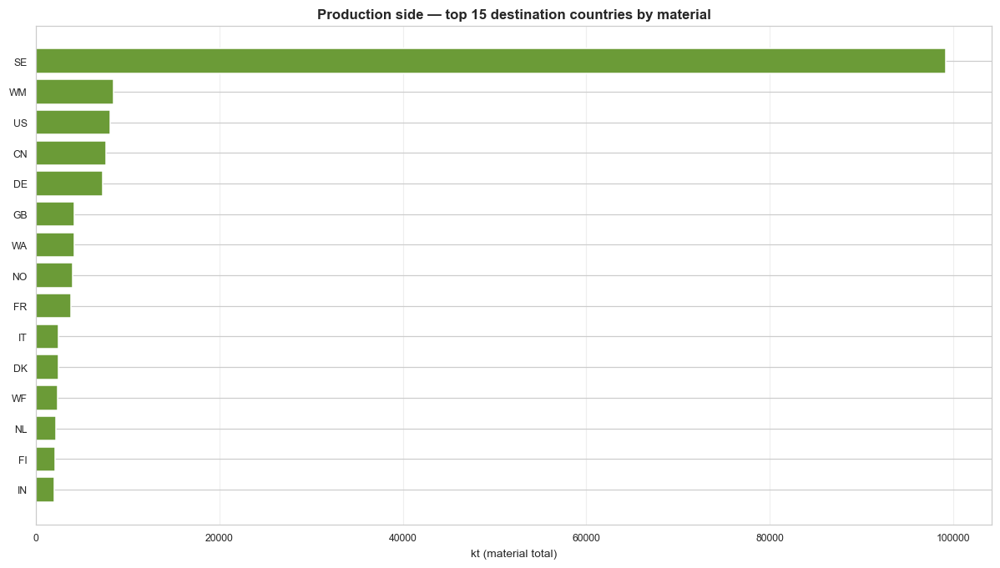

In [19]:
plot_top_horiz(mat_dest_country.rename("Material total (kt)").to_frame(),
    "Material total (kt)",
    f"Production side — top {TOP_N} destination countries by material",
    "kt (material total)", "#6b9b37",
    "fig_pba_dest_material.png")


### 9.4–9.6 Sankeys — production-side destination flows

Left column: top Swedish producing sectors. Right column: destination countries. Dark red = Sweden.

For the economic Sankey, the destination is the **immediate buyer country**. For GHG and material, the destination is the **final-demand country** (Leontief-traced).


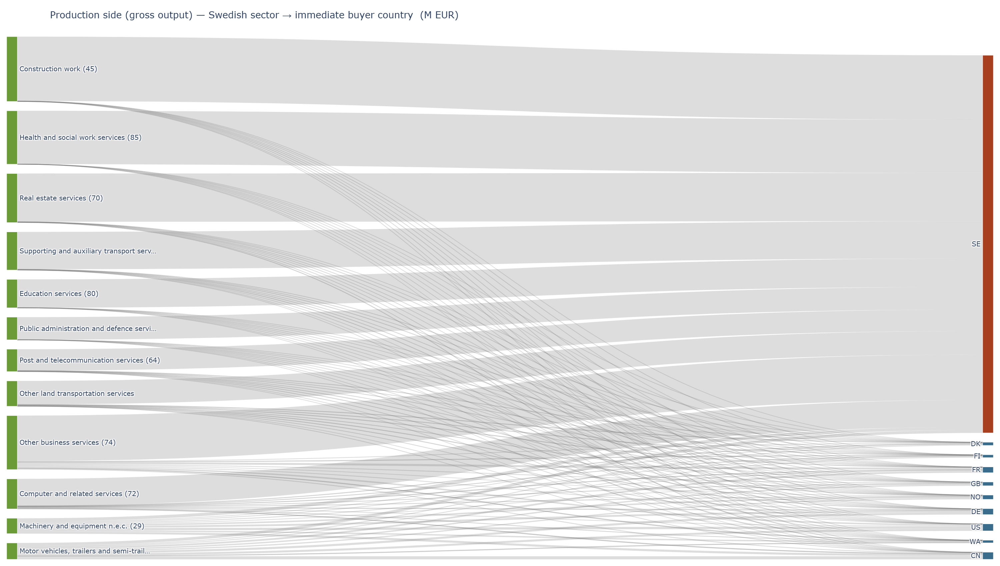

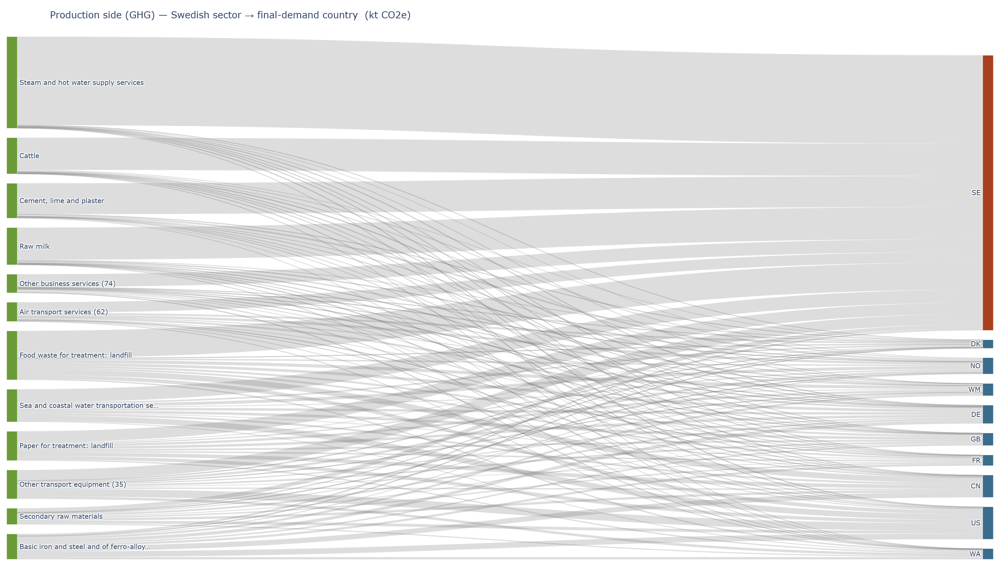

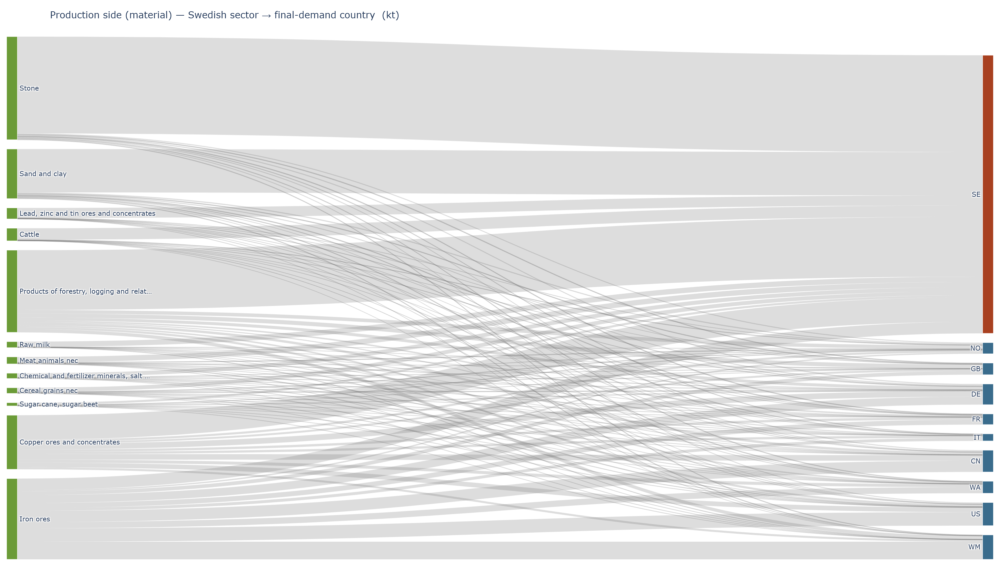

In [20]:
# For the economic dimension, F_econ_dest already has region columns (no MultiIndex needed)
_ = sankey_sector_to_destination(F_econ_dest, x_SE,
    "Production side (gross output) — Swedish sector → immediate buyer country",
    "sankey_econ_destination.png", unit_label="M EUR")

_ = sankey_sector_to_destination(
    F_ghg_dest.T.groupby(level="region").sum().T,
    F_ghg_SE,
    "Production side (GHG) — Swedish sector → final-demand country",
    "sankey_ghg_destination.png", unit_label="kt CO2e")

_ = sankey_sector_to_destination(
    F_mat_dest_total.T.groupby(level="region").sum().T,
    F_mat_total_SE,
    "Production side (material) — Swedish sector → final-demand country",
    "sankey_material_destination.png", unit_label="kt")


## 10. Source location vs final-demand destination share

For **GHG and material**: what share of Sweden's consumption footprint (CBA) is generated inside Sweden versus abroad? And what share of Sweden's territorial production impacts (PBA) serves Swedish final demand versus foreign final demand?

These are physical-impact shares, not literal flows of materials or emissions across borders. The labels reflect this: "Generated in SE" / "Generated abroad" for the CBA side; "SE final demand" / "Foreign final demand" for the production side.

The economic dimension is excluded because gross output (production side) and direct expenditure (consumption side) measure different supply-chain stages and do not form a valid comparable pair.


### 10.1 GHG — source location (CBA) and final-demand destination (production side)


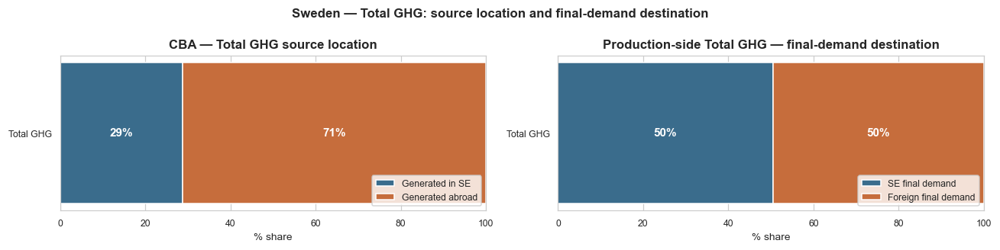

In [21]:
def domestic_int_bar(src_country, dest_country, dimension, filename):
    """Two stacked bars per dimension: CBA source location and production-side
    final-demand destination. Shown side by side for readability — they are
    complementary views of the same dimension, not a comparison panel."""
    se_cba  = float(src_country.get(REGION, 0))
    tot_cba = float(src_country.sum())
    se_pba  = float(dest_country.get(REGION, 0))
    tot_pba = float(dest_country.sum())

    pct_cba_se  = se_cba  / tot_cba * 100 if tot_cba else 0
    pct_cba_fgn = 100 - pct_cba_se
    pct_pba_se  = se_pba  / tot_pba * 100 if tot_pba else 0
    pct_pba_fgn = 100 - pct_pba_se

    fig, axes = plt.subplots(1, 2, figsize=(12, 3))

    for ax, dom, other, dom_lbl, other_lbl, title in [
        (axes[0], pct_cba_se,  pct_cba_fgn,
         "Generated in SE", "Generated abroad",
         f"CBA — {dimension} source location"),
        (axes[1], pct_pba_se,  pct_pba_fgn,
         "SE final demand", "Foreign final demand",
         f"Production-side {dimension} — final-demand destination"),
    ]:
        ax.barh([dimension], [dom],  color="#3a6c8c", label=dom_lbl)
        ax.barh([dimension], [other], left=[dom], color="#c66d3c", label=other_lbl)
        ax.set_xlim(0, 100)
        ax.set_xlabel("% share")
        ax.set_title(title, weight="bold")
        ax.legend(loc="lower right", fontsize=8)
        if dom > 6:
            ax.text(dom/2, 0, f"{dom:.0f}%", ha="center", va="center",
                    color="white", weight="bold", fontsize=10)
        if other > 6:
            ax.text(dom + other/2, 0, f"{other:.0f}%", ha="center", va="center",
                    color="white", weight="bold", fontsize=10)

    fig.suptitle(f"Sweden — {dimension}: source location and final-demand destination",
                 fontsize=11, weight="bold")
    fig.tight_layout()
    plt.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()

domestic_int_bar(src_ghg_country, ghg_dest_country,
                 "Total GHG", "fig_domestic_vs_intl_ghg.png")


### 10.2 Material — source location (CBA) and final-demand destination (production side)


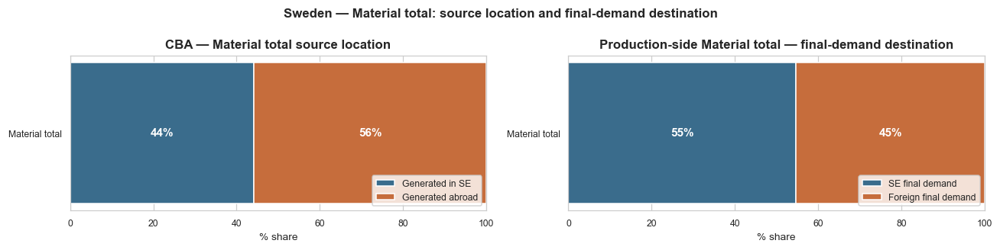

In [22]:
domestic_int_bar(src_mat_country, mat_dest_country,
                 "Material total", "fig_domestic_vs_intl_material.png")
